In [1]:
from pathlib import Path
import os
from pprint import pprint

from matplotlib import gridspec
import seaborn as sns
import numpy as np
import torch
import matplotlib.pyplot as plt
from tqdm import tqdm

from sklearn.decomposition import PCA

import sys
sys.path.append('../../')
sys.path.append('../')

from src import mod_cog_tasks as mct 
from src import mod_cog_data_utils as mcdu
from src import analysis_utils as au
from src import plot_utils as pu
from src.mod_cog_tasks import *
from src import eg_utils

def get_device():
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
device = get_device()
print(device)

os.makedirs("figs", exist_ok=True)


Gym has been unmaintained since 2022 and does not support NumPy 2.0 amongst other critical functionality.
Please upgrade to Gymnasium, the maintained drop-in replacement of Gym, or contact the authors of your software and request that they upgrade.
See the migration guide at https://gymnasium.farama.org/introduction/migration_guide/ for additional information.


['/home/mila/p/pingsheng.li/projects/eg_rnns/eg_reach_oc/analysis_fpf/arial.ttf', '/home/mila/p/pingsheng.li/projects/eg_rnns/mod_cog_fpf/arial.ttf', '/home/mila/p/pingsheng.li/projects/eg_rnns/mod_cog_dsa/arial.ttf', '/home/mila/p/pingsheng.li/projects/eg_rnns/src/arial.ttf', '/home/mila/p/pingsheng.li/projects/eg_rnns/mod_cog_vizualisation/arial.ttf', '/home/mila/p/pingsheng.li/projects/eg_rnns/mod_cog/analysis/arial.ttf']
/home/mila/p/pingsheng.li/projects/eg_rnns/eg_reach_oc/analysis_fpf/arial.ttf
/home/mila/p/pingsheng.li/projects/eg_rnns/eg_reach_oc/analysis_fpf/arial.ttf
/home/mila/p/pingsheng.li/projects/eg_rnns/mod_cog_fpf/arial.ttf
/home/mila/p/pingsheng.li/projects/eg_rnns/mod_cog_fpf/arial.ttf
/home/mila/p/pingsheng.li/projects/eg_rnns/mod_cog_dsa/arial.ttf
/home/mila/p/pingsheng.li/projects/eg_rnns/mod_cog_dsa/arial.ttf
/home/mila/p/pingsheng.li/projects/eg_rnns/src/arial.ttf
/home/mila/p/pingsheng.li/projects/eg_rnns/src/arial.ttf
/home/mila/p/pingsheng.li/projects/eg_rnn

In [2]:
# Enable auto-reloading of modules
%load_ext autoreload
%autoreload 2

In [3]:
import mod_cog_vizualisation.viz_utils as vu

In [4]:
env_strs = mct.get_mod_cog_dataset_labels()
envs = mct.get_mod_cog_dataset_envs()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Make discrete HSV colors for 16 bins
n_classes = 16
colors = plt.cm.hsv(np.linspace(0, 1, n_classes, endpoint=False))
cmap = mcolors.ListedColormap(colors)
norm = mcolors.BoundaryNorm(range(n_classes+1), cmap.N)

# Plot the colorbar directly
fig, ax = plt.subplots(figsize=(6, 0.5))
fig.colorbar(
    plt.cm.ScalarMappable(cmap=cmap, norm=norm),
    cax=ax, orientation='horizontal',
    ticks=list(range(n_classes)),
    label='Target'
)
plt.savefig('figs/mod_cog_colorbar.pdf', bbox_inches='tight', transparent=True)
plt.savefig('figs/mod_cog_colorbar.svg', bbox_inches='tight', transparent=True)
plt.show()

# 1. Load saved activity

In [ ]:
#  Get all final experiments 
linclab_drive  = Path("/network/projects/_groups/linclab_users/eg/")

dsa_analysis_dir = linclab_drive/"modcog/analysis_dsa_fixlen/"
dsa_analysis_dir.mkdir(parents=True, exist_ok=True)
pprint(list(dsa_analysis_dir.iterdir()))

eg_dir = dsa_analysis_dir/"eg"
gd_dir = dsa_analysis_dir/"gd"
pprint(list(eg_dir.iterdir()))

pprint(list((eg_dir/"seed_5").iterdir())[:])

[PosixPath('/network/projects/_groups/linclab_users/eg/modcog/analysis_dsa_v2/eg'),
 PosixPath('/network/projects/_groups/linclab_users/eg/modcog/analysis_dsa_v2/gd')]
[PosixPath('/network/projects/_groups/linclab_users/eg/modcog/analysis_dsa_v2/eg/seed_5'),
 PosixPath('/network/projects/_groups/linclab_users/eg/modcog/analysis_dsa_v2/eg/seed_6'),
 PosixPath('/network/projects/_groups/linclab_users/eg/modcog/analysis_dsa_v2/eg/seed_7'),
 PosixPath('/network/projects/_groups/linclab_users/eg/modcog/analysis_dsa_v2/eg/seed_8'),
 PosixPath('/network/projects/_groups/linclab_users/eg/modcog/analysis_dsa_v2/eg/seed_9')]
[PosixPath('/network/projects/_groups/linclab_users/eg/modcog/analysis_dsa_v2/eg/seed_5/0_go_data.npz'),
 PosixPath('/network/projects/_groups/linclab_users/eg/modcog/analysis_dsa_v2/eg/seed_5/1_rtgo_data.npz'),
 PosixPath('/network/projects/_groups/linclab_users/eg/modcog/analysis_dsa_v2/eg/seed_5/2_dlygo_data.npz'),
 PosixPath('/network/projects/_groups/linclab_users/eg/mo

In [7]:
eg_seed_strs = [p.name for p in list(eg_dir.iterdir())]
gd_seed_strs = [p.name for p in list(gd_dir.iterdir())]


In [8]:
def _resolve_local_arial():
    """Load local arial.ttf in this folder if present, return its font name."""
    try:
        from matplotlib import font_manager as fm
        from pathlib import Path
        here = Path(__file__).parent if '__file__' in globals() else Path.cwd() / 'mod_cog_vizualisation'
        candidates = [here / 'arial.ttf', Path.cwd() / 'mod_cog_vizualisation' / 'arial.ttf', Path.cwd() / 'arial.ttf']
        for p in candidates:
            if p.exists():
                fm.fontManager.addfont(str(p))
                return fm.FontProperties(fname=str(p)).get_name()
    except Exception:
        pass
    return 'Arial'

def _apply_fig1a_style_local(font_family=None):
    """Local Fig1a-like styling for PCA trajectory plots."""
    ff = font_family or _resolve_local_arial()
    ff_list = [ff] if isinstance(ff, str) else ff
    plt.rcParams.update({
        'font.family': ff,
        'font.sans-serif': ff_list,
        'axes.edgecolor': 'black',
        'axes.linewidth': 2.0,
        'lines.linewidth': 2.6,
        'xtick.major.width': 1.8,
        'ytick.major.width': 1.8,
        'xtick.minor.width': 1.0,
        'ytick.minor.width': 1.0,
        'xtick.major.size': 6,
        'ytick.major.size': 6,
        'xtick.minor.size': 3,
        'ytick.minor.size': 3,
        'axes.labelsize': 14,
        'axes.titlesize': 14,
        'xtick.labelsize': 12,
        'ytick.labelsize': 12,
        'legend.fontsize': 12,
        'font.weight': 'bold',
        'axes.labelweight': 'bold',
        'axes.titleweight': 'bold',
        'axes.spines.top': False,
        'axes.spines.right': False,
    })

def _style_axes_fig1a(ax):
    """Apply Fig1a-style axes tweaks to a single axis."""
    try:
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['left'].set_linewidth(1.4)
        ax.spines['bottom'].set_linewidth(1.4)
        ax.tick_params(axis='both', which='both', width=1.4, length=5)
    except Exception:
        pass
    # 3D axes: remove pane fill and grid for cleaner look
    if hasattr(ax, 'xaxis') and hasattr(ax.xaxis, 'set_pane_color'):
        ax.xaxis.set_pane_color((1, 1, 1, 0))
        ax.yaxis.set_pane_color((1, 1, 1, 0))
        if hasattr(ax, 'zaxis'):
            ax.zaxis.set_pane_color((1, 1, 1, 0))
        ax.grid(False)

def _algo_label(analysis_obj):
    label = getattr(analysis_obj, 'algo_label', '')
    if label:
        return str(label).upper()
    root = getattr(analysis_obj, 'root_dir', None)
    if root is not None:
        name = getattr(root, 'name', str(root))
        name_l = name.lower()
        if 'gd' in name_l:
            return 'GD'
        if 'eg' in name_l:
            return 'EG'
    return ''

def _cap_title(s):
    s = s.replace('_', ' ')
    return s.title() if s else s

def analyse_(analysis_obj):
    """
    Assumes analysis_obj.seed_data has been populated
    """
    _apply_fig1a_style_local()
    print(analysis_obj.root_dir)

    for seed in analysis_obj.seed_strs:
        dim = 3
        dim = 2
        # Returns a dict: period_name -> list of slices across trials.
        analysis_obj.seed_period_slices[seed] = vu.process_timings(analysis_obj.seed_data[seed]["timings"])
        # Use start of decision period to create a list of trial targets
        trial_targets = vu.get_trial_targets(analysis_obj.seed_period_slices[seed],
                                             analysis_obj.seed_data[seed]["targets"])
        # get a dict of period : array, Note: could change function name
        period_acts = vu.stack_acts(analysis_obj.seed_data[seed]["acts"],
                                    analysis_obj.seed_period_slices[seed])

        # run pca on the entire data (run_pca stacks and unstacks the array)
        projected_arr, pca_obj = vu.run_pca(analysis_obj.seed_data[seed]["acts"])
        seed_pca_objs = {"all": pca_obj}
        seed_pca_proj = {"all": projected_arr}

        for period in period_acts.keys():
            projected_arr, pca_obj = vu.run_pca(period_acts[period])
            if projected_arr is None:
                print(f"No data for period {period}")
                continue
            seed_pca_objs[period] = pca_obj
            seed_pca_proj[period] = projected_arr

        fig, axs = vu.plot_pca_trajectories(seed_pca_proj, 2, trial_targets, show=False)
        for ax in axs:
            _style_axes_fig1a(ax)
            title = _cap_title(ax.get_title())
            ax.set_title(title, fontsize=12, fontweight='bold')

        task_name = _cap_title(getattr(analysis_obj, 'env_str', ''))
        task_id = getattr(analysis_obj, 'env_idx', '')
        algo = _algo_label(analysis_obj)
        title_bits = [b for b in [algo, f"{task_id}_{task_name}", f"{seed}".capitalize()] if b]
        fig.suptitle(' | '.join(title_bits), fontsize=12, fontweight='bold', y=1.02)
        fig.tight_layout(rect=[0, 0, 1, 0.95])
        # Save figures
        out_dir = Path('figs')
        out_dir.mkdir(parents=True, exist_ok=True)
        safe_task = f"{task_id}_{task_name}".replace(' ', '-').replace('/', '-')
        safe_algo = algo if algo else 'ALG'
        fname = f"{safe_algo}_{safe_task}_seed-{seed}"
        fig.savefig(out_dir / f"{fname}.pdf", bbox_inches='tight', transparent=True)
        fig.savefig(out_dir / f"{fname}.svg", bbox_inches='tight')
        plt.show()

def analyse_3d_(analysis_obj):
    """
    Assumes analysis_obj.seed_data has been populated
    """
    _apply_fig1a_style_local()

    for seed in analysis_obj.seed_strs:
        # Returns a dict: period_name -> list of slices across trials.
        analysis_obj.seed_period_slices[seed] = vu.process_timings(analysis_obj.seed_data[seed]["timings"])
        # Use start of decision period to create a list of trial targets
        trial_targets = vu.get_trial_targets(analysis_obj.seed_period_slices[seed],
                                             analysis_obj.seed_data[seed]["targets"])
        # get a dict of period : array, Note: could change function name
        period_acts = vu.stack_acts(analysis_obj.seed_data[seed]["acts"],
                                    analysis_obj.seed_period_slices[seed])

        # run pca on the entire data (run_pca stacks and unstacks the array)
        projected_arr, pca_obj = vu.run_pca(analysis_obj.seed_data[seed]["acts"])
        seed_pca_objs = {"all": pca_obj}
        seed_pca_proj = {"all": projected_arr}

        for period in period_acts.keys():
            projected_arr, pca_obj = vu.run_pca(period_acts[period])
            if projected_arr is None:
                print(f"No data for period {period}")
                continue
            seed_pca_objs[period] = pca_obj
            seed_pca_proj[period] = projected_arr

        fig, axs = vu.plot_pca_trajectories(seed_pca_proj, 3, trial_targets, show=False)
        for ax in axs:
            _style_axes_fig1a(ax)
            title = _cap_title(ax.get_title())
            ax.set_title(title, fontsize=12, fontweight='bold')

        task_name = _cap_title(getattr(analysis_obj, 'env_str', ''))
        task_id = getattr(analysis_obj, 'env_idx', '')
        algo = _algo_label(analysis_obj)
        title_bits = [b for b in [algo, f"{task_id}_{task_name}", f"{seed}".capitalize()] if b]
        fig.suptitle(' | '.join(title_bits), fontsize=12, fontweight='bold', y=1.02)
        fig.tight_layout(rect=[0, 0, 1, 0.95])
        # Save figures
        out_dir = Path('figs')
        out_dir.mkdir(parents=True, exist_ok=True)
        safe_task = f"{task_id}_{task_name}".replace(' ', '-').replace('/', '-')
        safe_algo = algo if algo else 'ALG'
        fname = f"{safe_algo}_{safe_task}_seed-{seed}"
        fig.savefig(out_dir / f"{fname}.pdf", bbox_inches='tight', transparent=True)
        fig.savefig(out_dir / f"{fname}.svg", bbox_inches='tight')


In [9]:
def plot_task(task_str):
    print(task_str)
    eg_analysis_obj = vu.TaskAnalysis(eg_dir, task_str, eg_seed_strs)
    gd_analysis_obj = vu.TaskAnalysis(gd_dir, task_str, gd_seed_strs)
    eg_analysis_obj.algo_label = "EG"
    gd_analysis_obj.algo_label = "GD"
    vu.load_seeds(gd_analysis_obj)
    vu.load_seeds(eg_analysis_obj)
    analyse_(gd_analysis_obj)
    analyse_(eg_analysis_obj)


0_go_data.npz
/network/projects/_groups/linclab_users/eg/modcog/analysis_dsa_v2/gd
No data for period delay


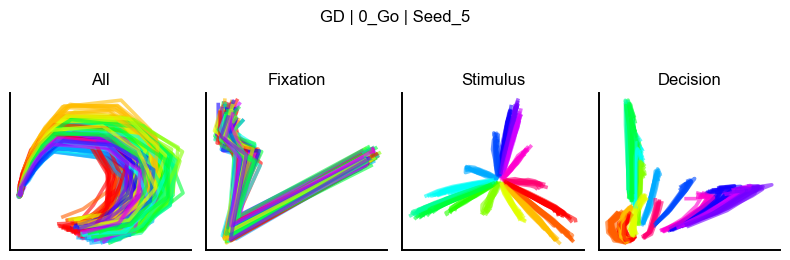

No data for period delay


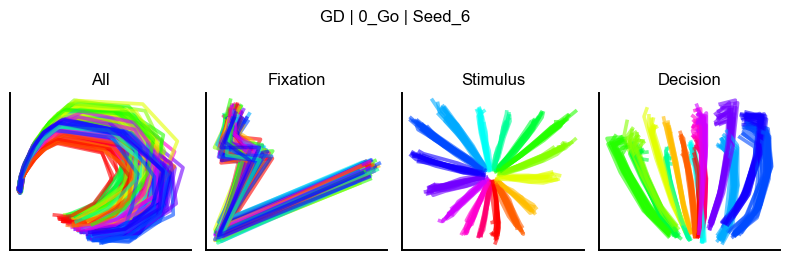

No data for period delay


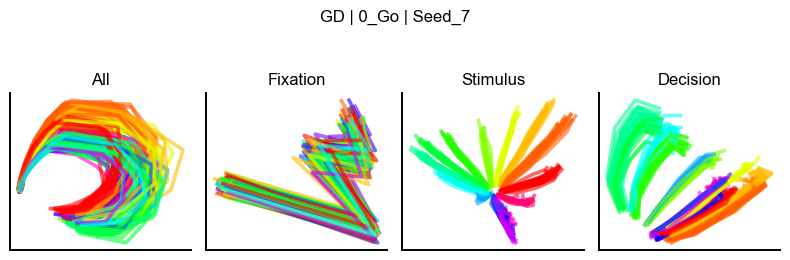

No data for period delay


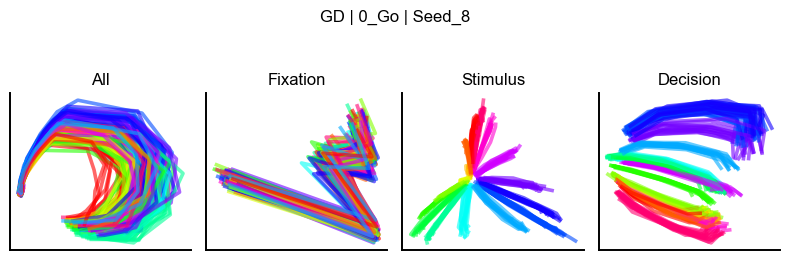

No data for period delay


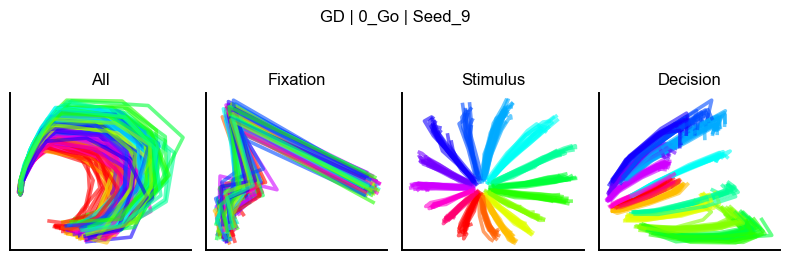

/network/projects/_groups/linclab_users/eg/modcog/analysis_dsa_v2/eg
No data for period delay


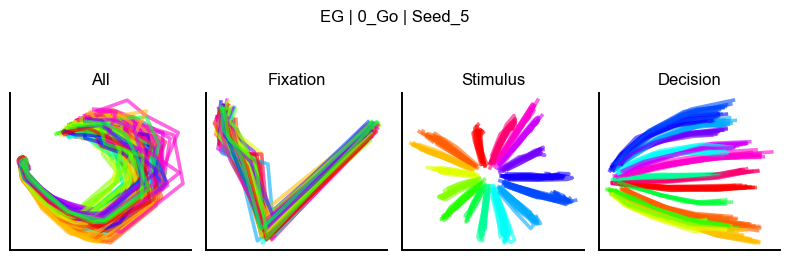

No data for period delay


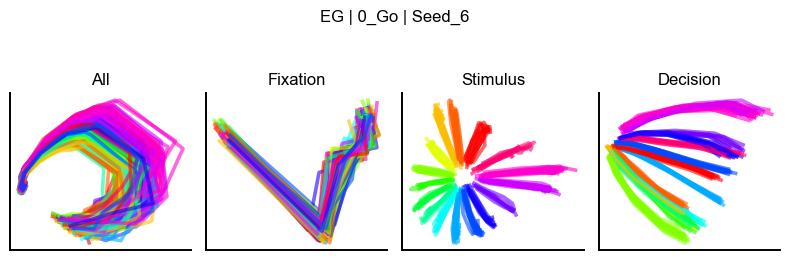

No data for period delay


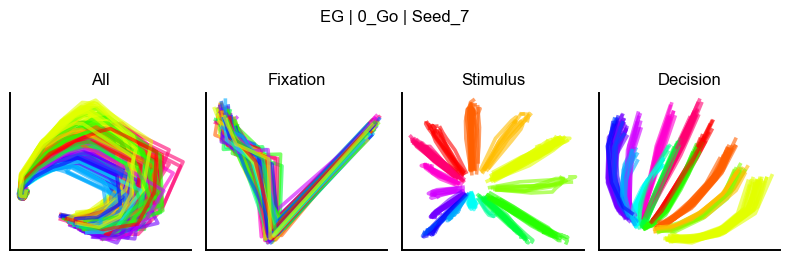

No data for period delay


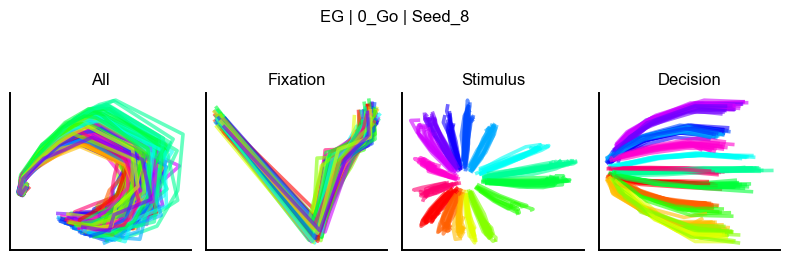

No data for period delay


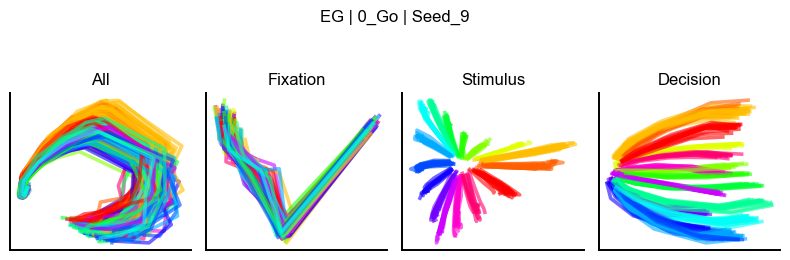

In [10]:
task_str = "0_go_data.npz"
plot_task(task_str)

1_rtgo_data.npz
/network/projects/_groups/linclab_users/eg/modcog/analysis_dsa_v2/gd


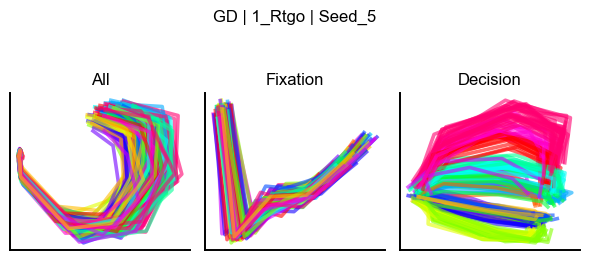

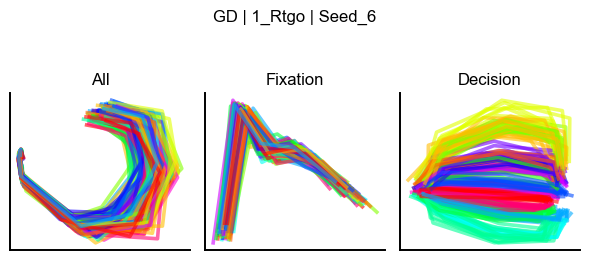

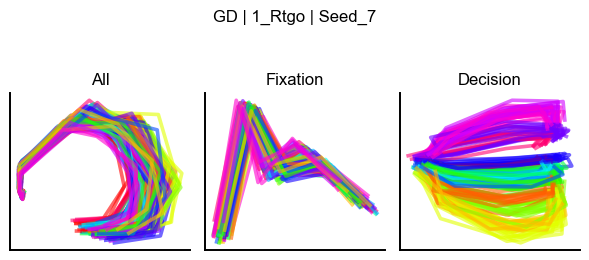

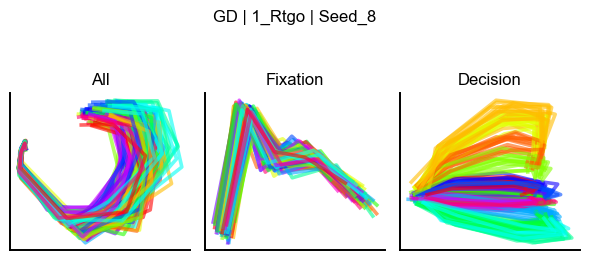

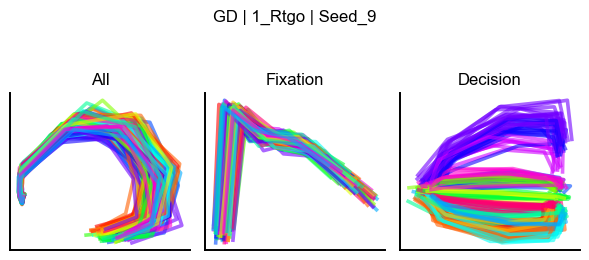

/network/projects/_groups/linclab_users/eg/modcog/analysis_dsa_v2/eg


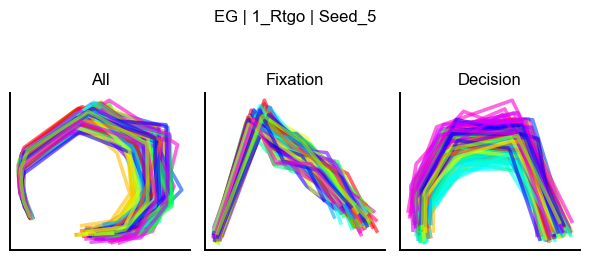

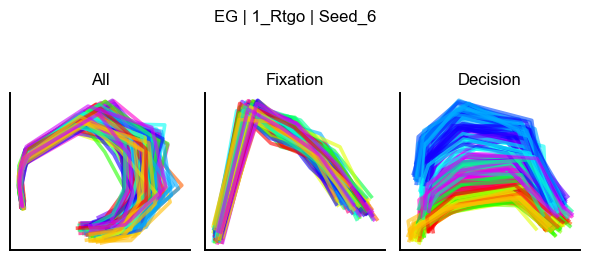

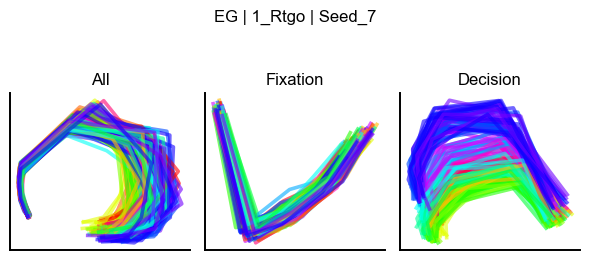

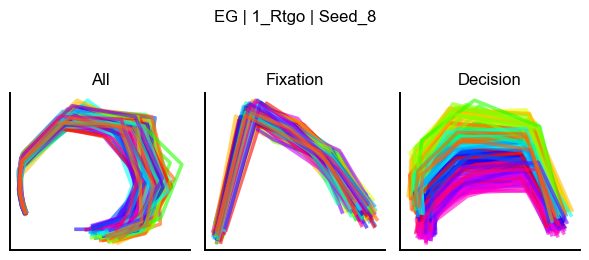

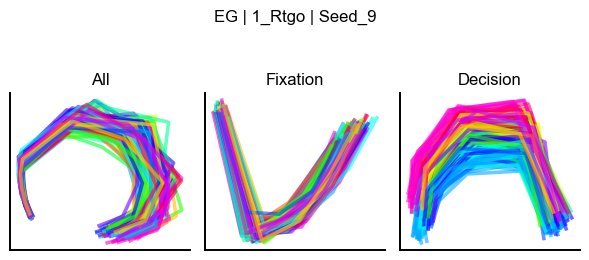

In [95]:
task_str = "1_rtgo_data.npz"
plot_task(task_str)

32_dlydm1intl_data.npz
/network/projects/_groups/linclab_users/eg/modcog/analysis_dsa_v2/gd


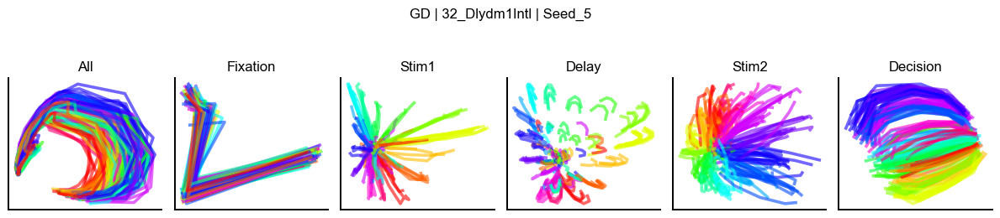

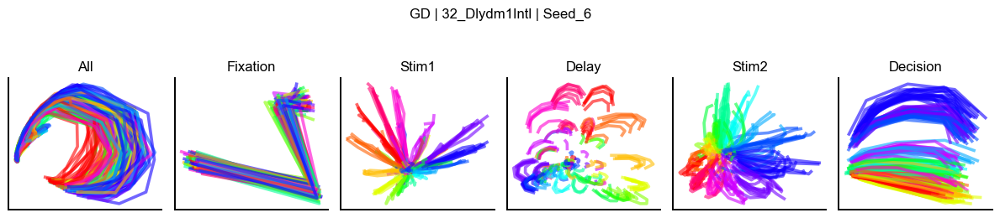

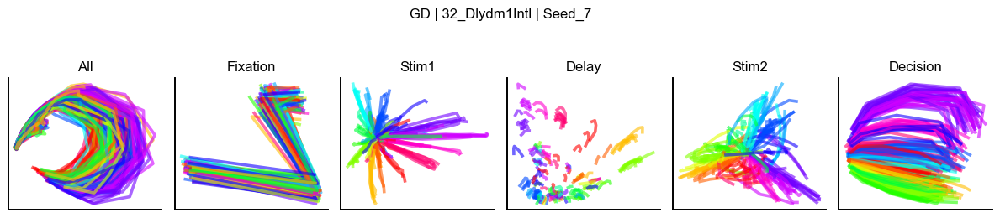

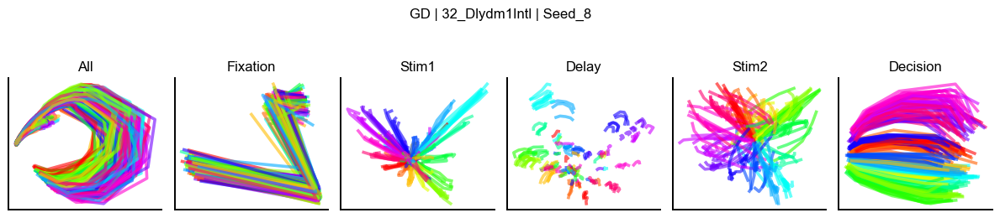

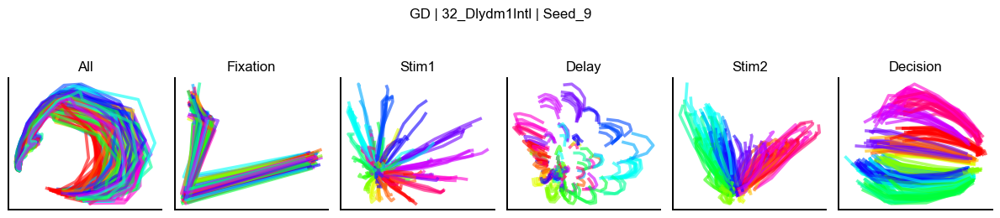

/network/projects/_groups/linclab_users/eg/modcog/analysis_dsa_v2/eg


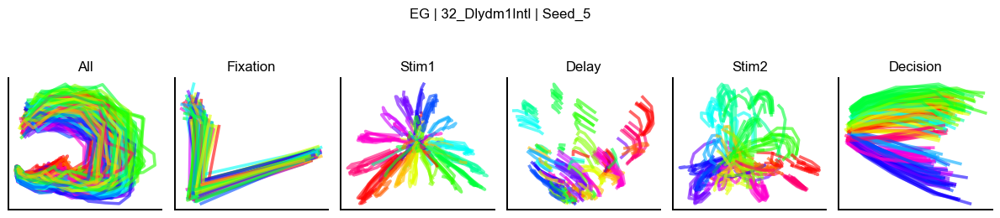

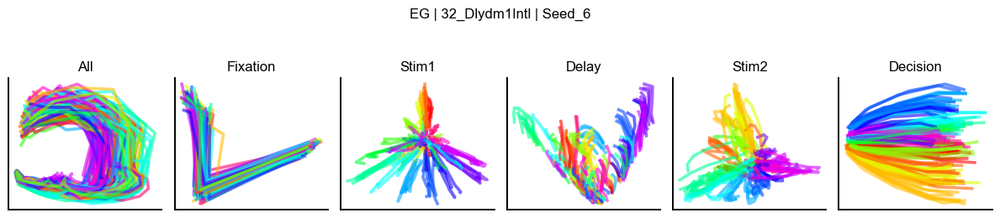

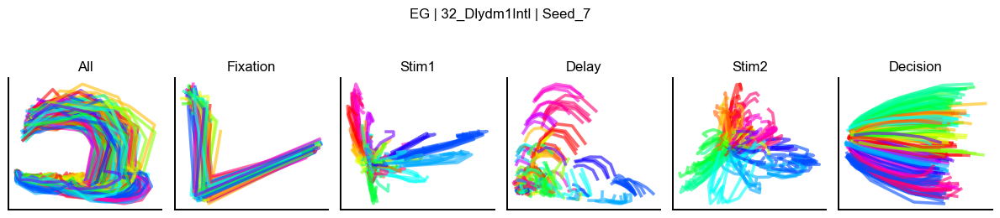

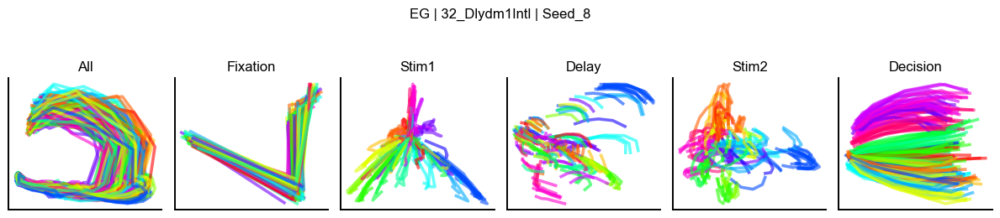

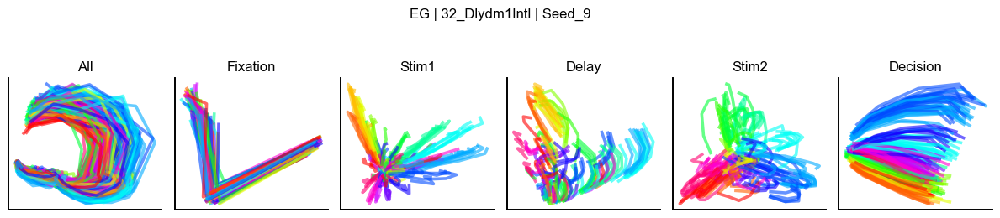

In [100]:
task_str = "32_dlydm1intl_data.npz"
plot_task(task_str)

52_dlydm1seqr_data.npz
/network/projects/_groups/linclab_users/eg/modcog/analysis_dsa_v2/gd


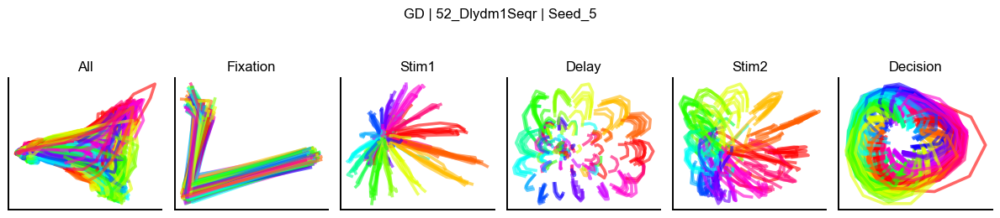

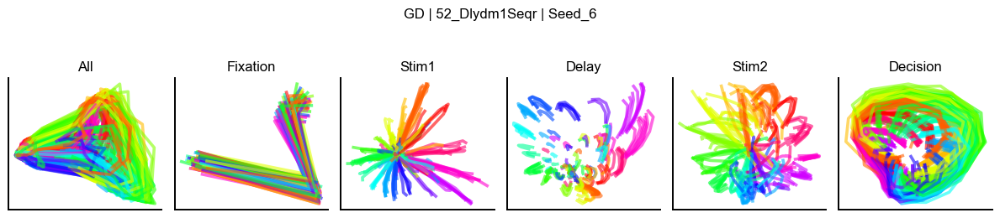

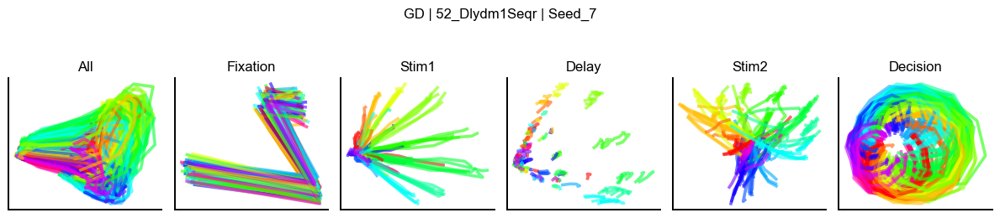

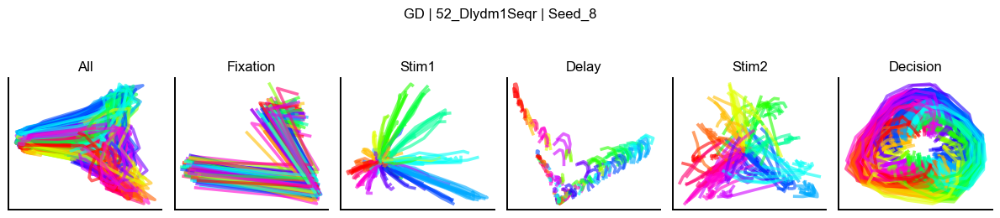

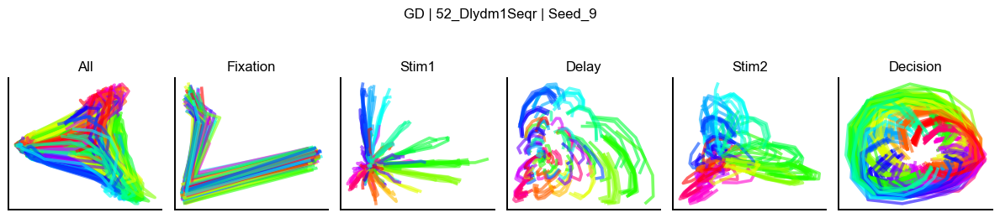

/network/projects/_groups/linclab_users/eg/modcog/analysis_dsa_v2/eg


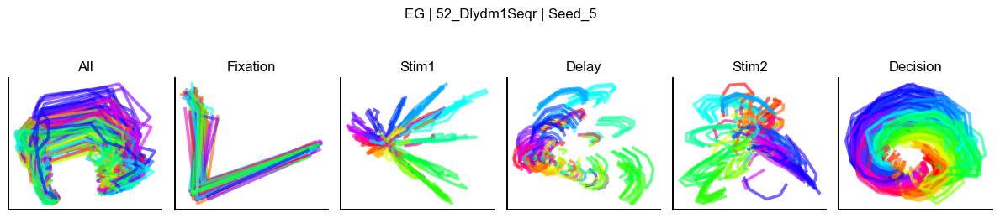

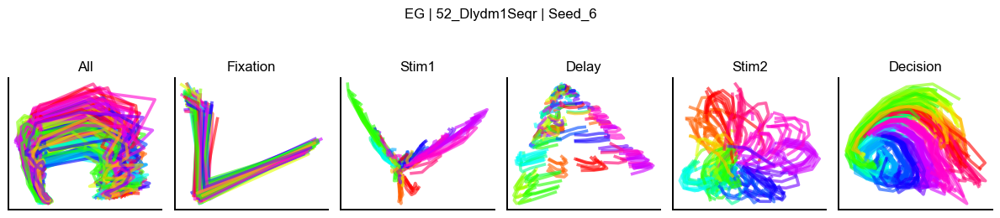

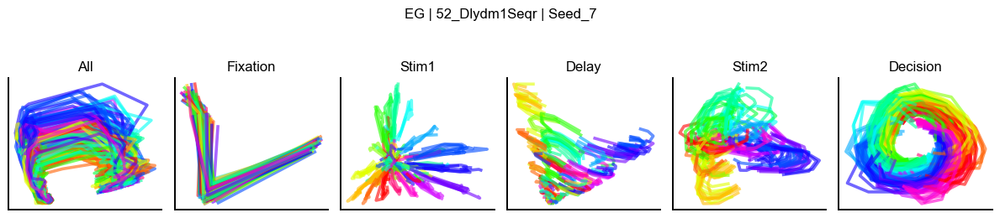

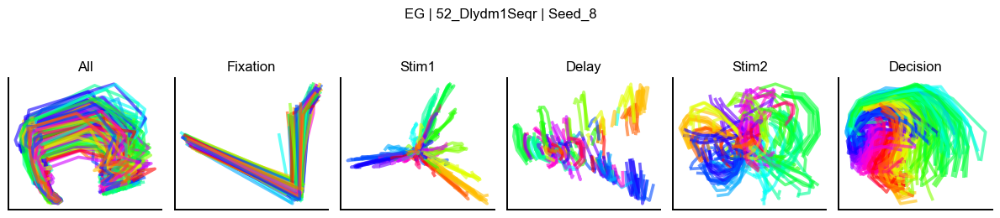

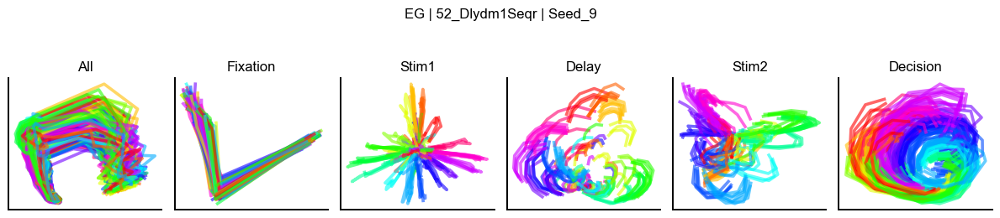

In [101]:
task_str = "52_dlydm1seqr_data.npz"
plot_task(task_str)

4_rtanti_data.npz
/network/projects/_groups/linclab_users/eg/modcog/analysis_dsa_v2/gd


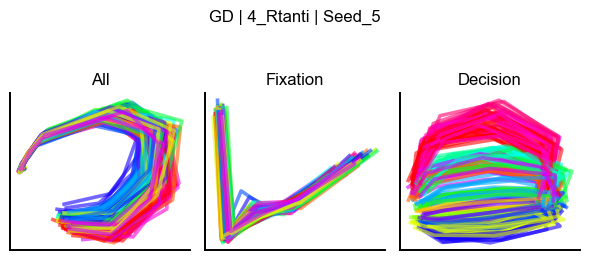

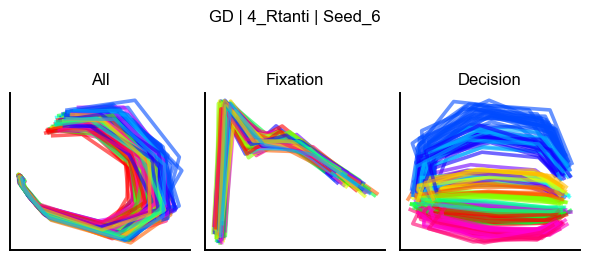

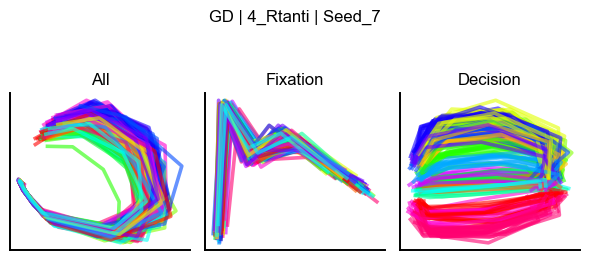

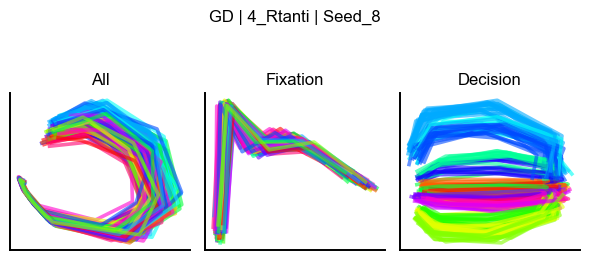

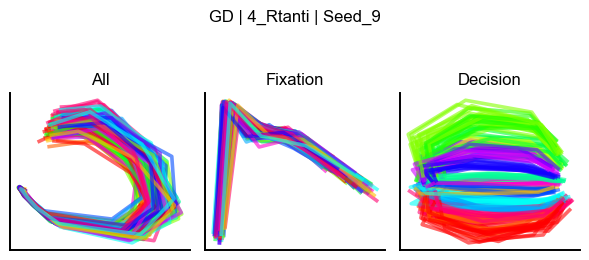

/network/projects/_groups/linclab_users/eg/modcog/analysis_dsa_v2/eg


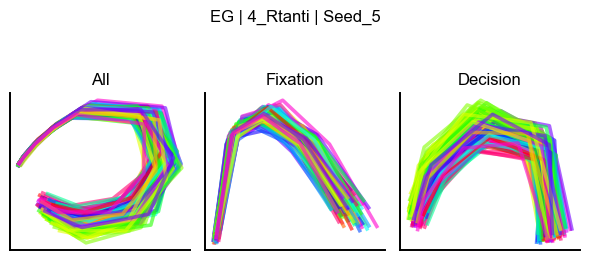

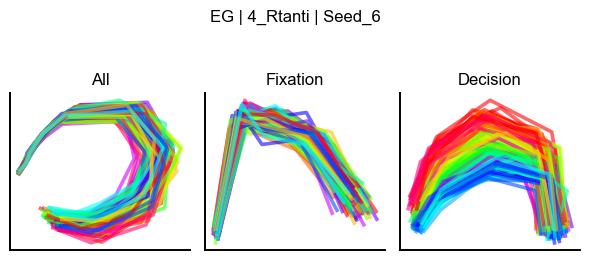

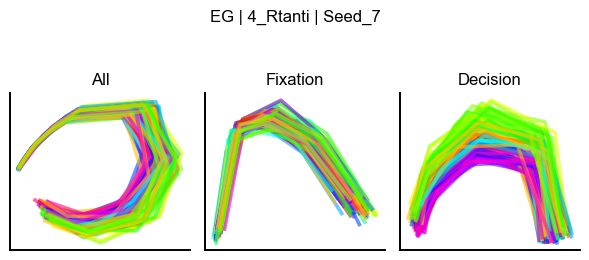

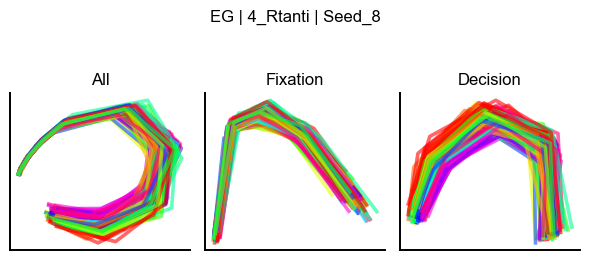

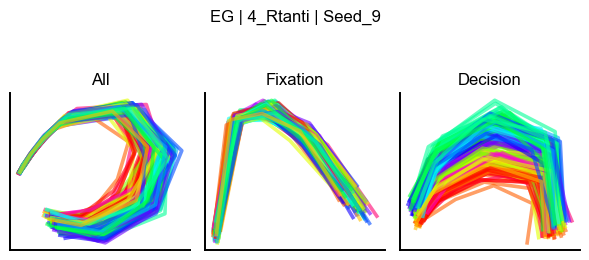

In [102]:
task_str = "4_rtanti_data.npz"
plot_task(task_str)

25_ctxdm2_data.npz
/network/projects/_groups/linclab_users/eg/modcog/analysis_dsa_v2/gd


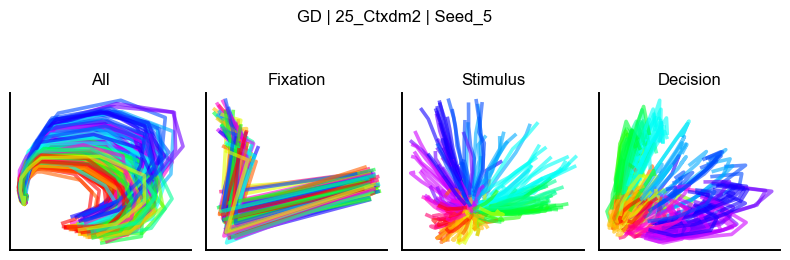

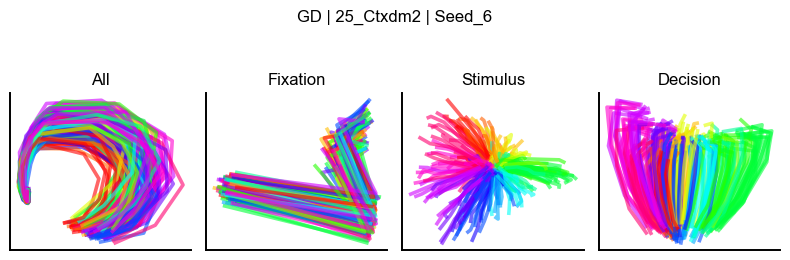

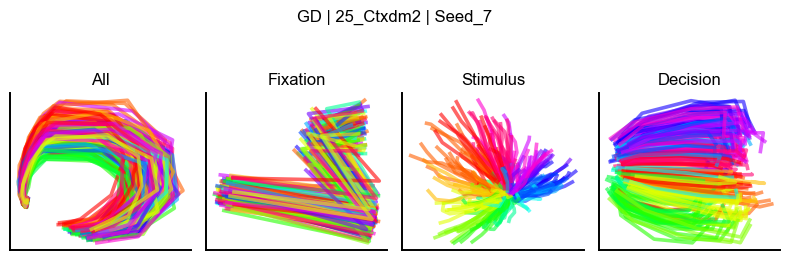

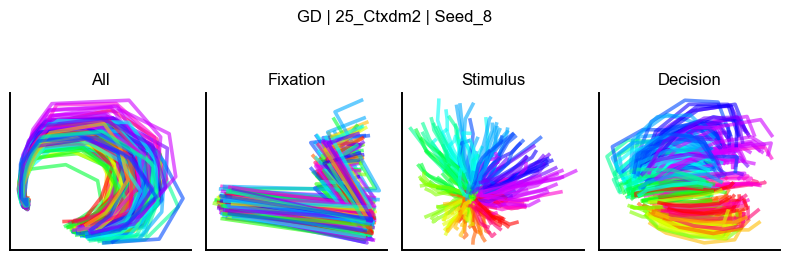

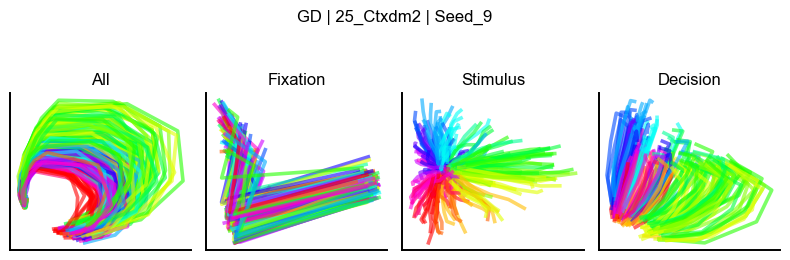

/network/projects/_groups/linclab_users/eg/modcog/analysis_dsa_v2/eg


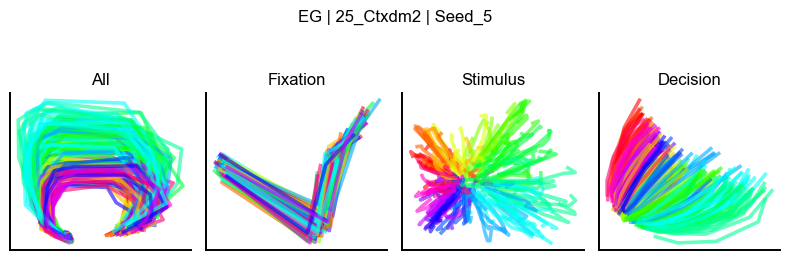

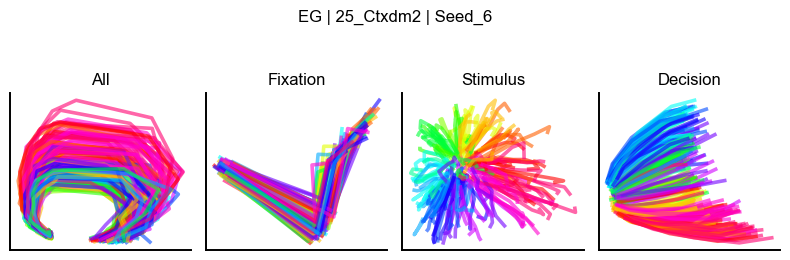

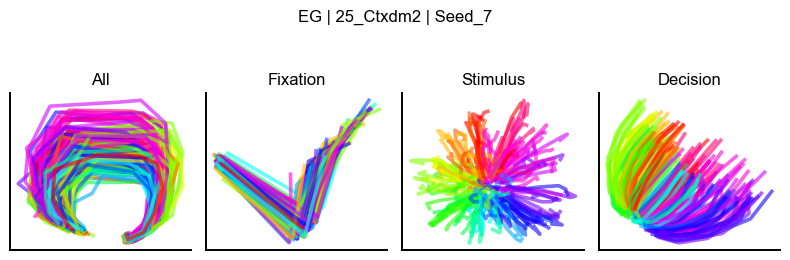

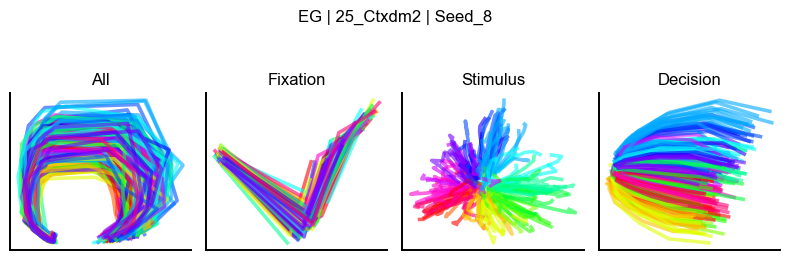

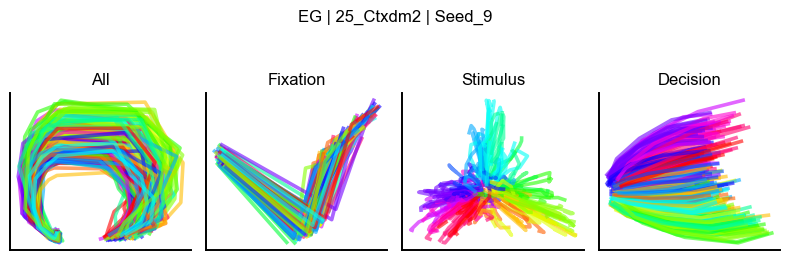

In [103]:
task_str = "25_ctxdm2_data.npz"
plot_task(task_str)

16_antiseqr_data.npz
/network/projects/_groups/linclab_users/eg/modcog/analysis_dsa_v2/gd
No data for period delay


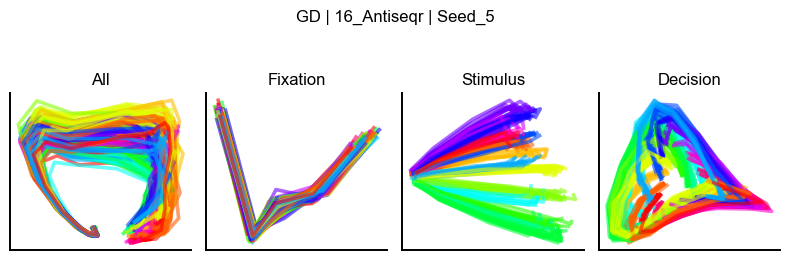

No data for period delay


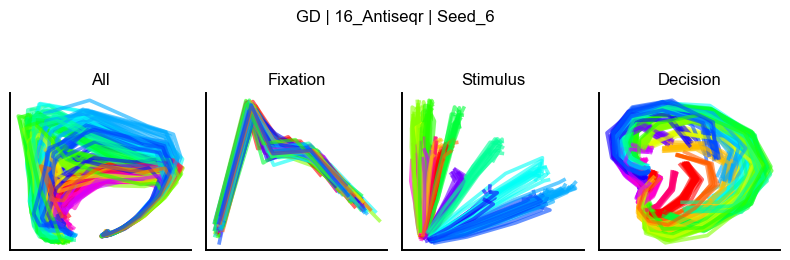

No data for period delay


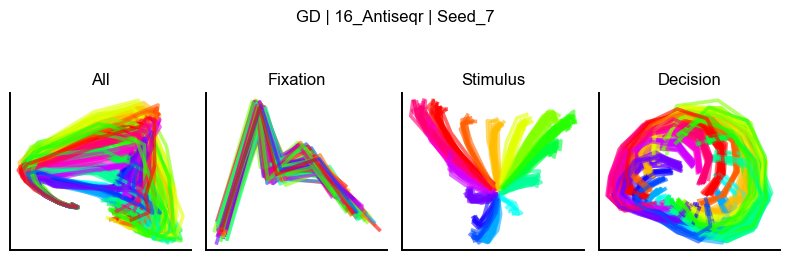

No data for period delay


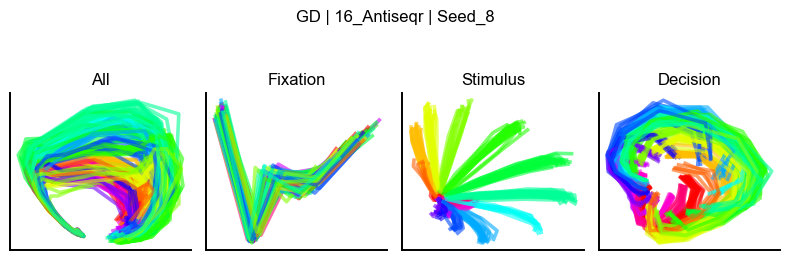

No data for period delay


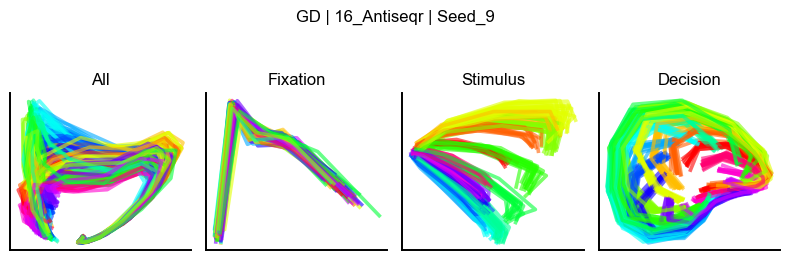

/network/projects/_groups/linclab_users/eg/modcog/analysis_dsa_v2/eg
No data for period delay


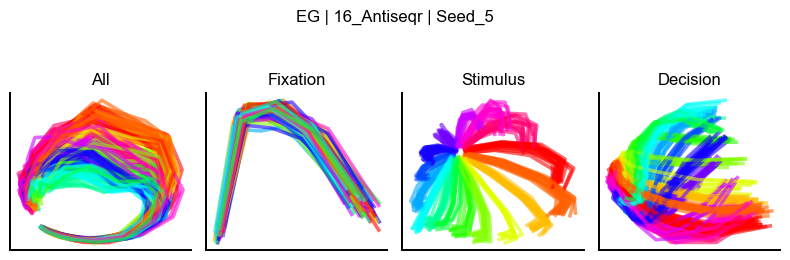

No data for period delay


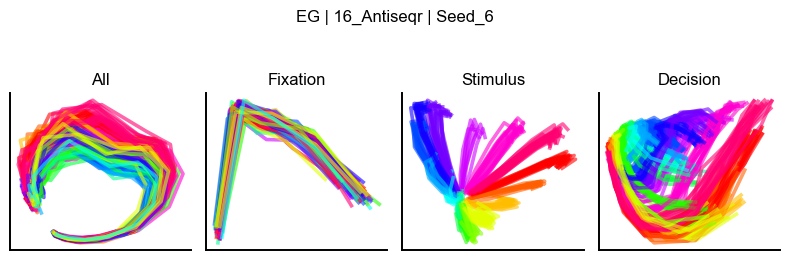

No data for period delay


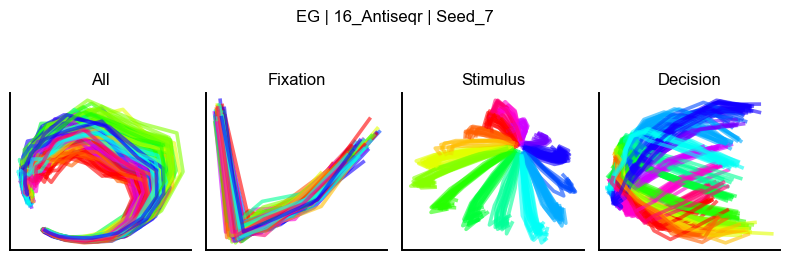

No data for period delay


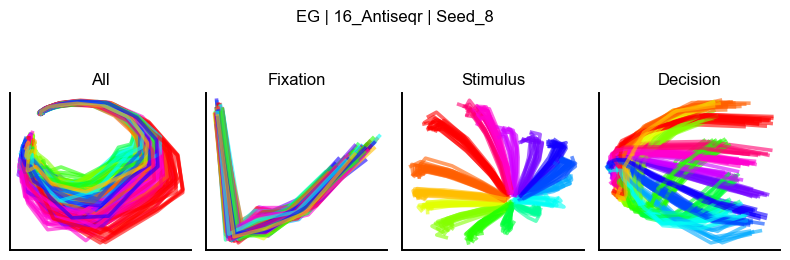

No data for period delay


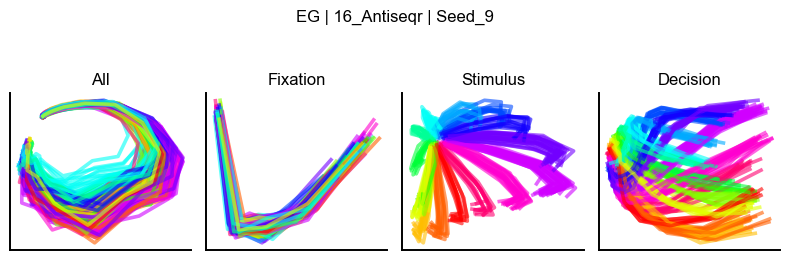

In [104]:
task_str = "16_antiseqr_data.npz"
plot_task(task_str)

8_dlyantiintl_data.npz
/network/projects/_groups/linclab_users/eg/modcog/analysis_dsa_v2/gd


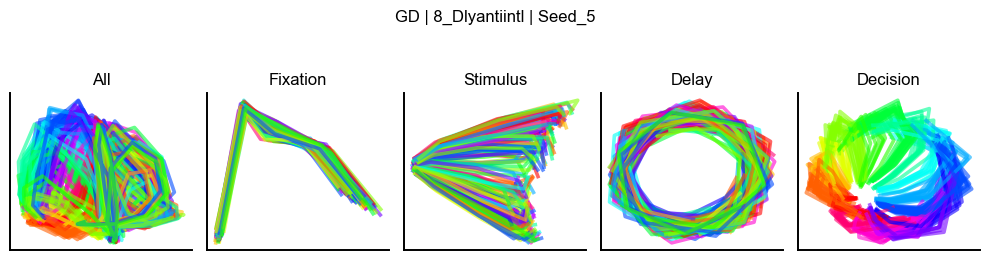

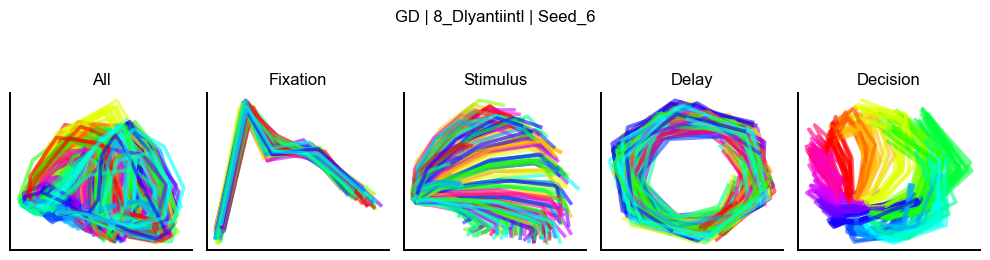

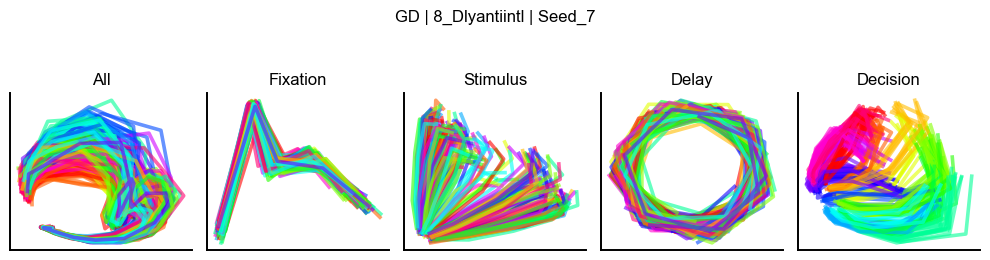

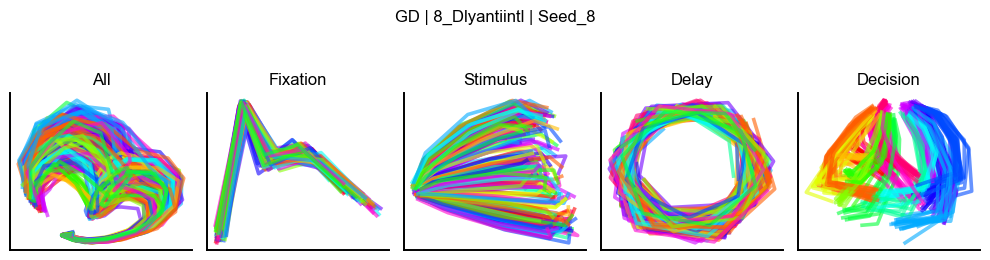

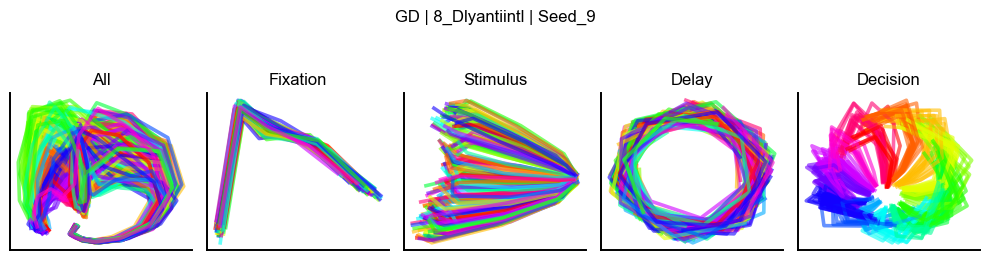

/network/projects/_groups/linclab_users/eg/modcog/analysis_dsa_v2/eg


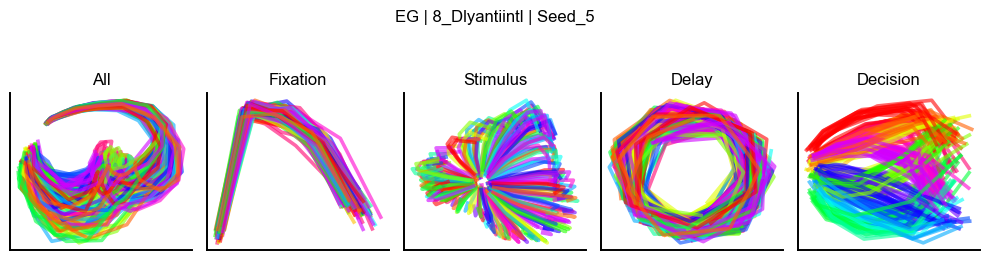

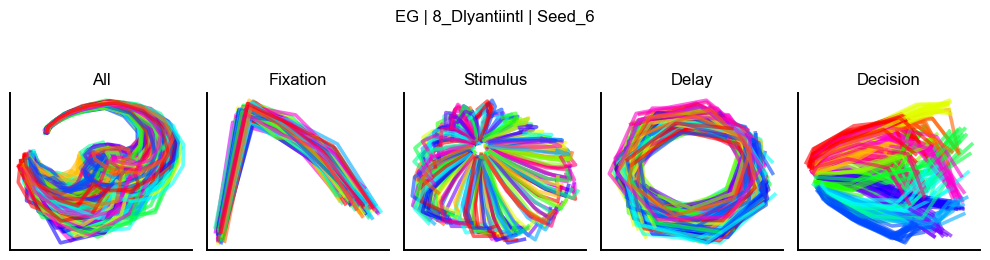

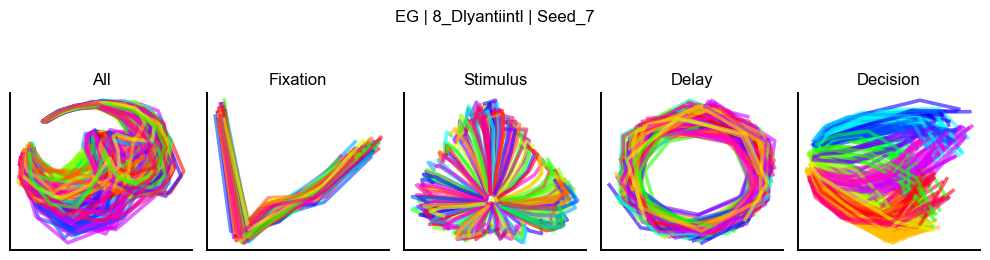

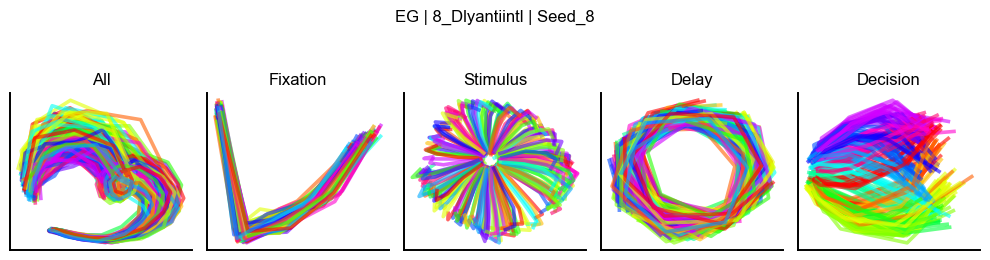

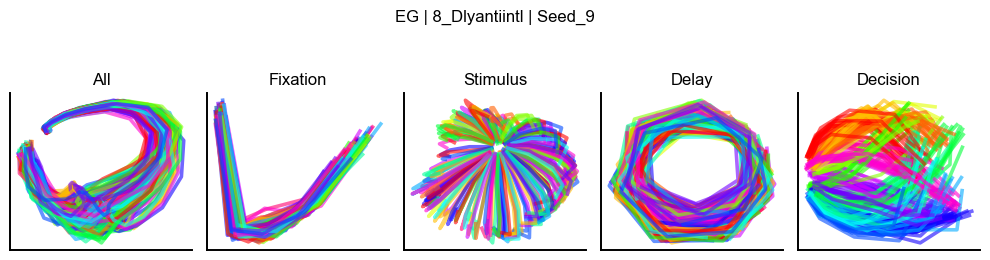

In [105]:
task_str = "8_dlyantiintl_data.npz"
plot_task(task_str)